<a href="https://colab.research.google.com/github/ArielaLevkov/ImageProcessing_TA/blob/main/recitations/13_ImageProcessingRecitation_Fourier3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import requests
from io import BytesIO
from ipywidgets import interactive
import matplotlib.pyplot as plt
import plotly.express as px
import PIL
from numpy.fft import fft2, ifft2, fftshift, ifftshift
import numpy as np
π = np.pi

In [2]:
GITHUB_PATH = 'https://raw.githubusercontent.com/ArielaLevkov/ImageProcessing_TA/main/images/'

def read_file(file_name:str, file_path:str=GITHUB_PATH) -> np.ndarray:
    '''
    Accept an image file name (defaulty located in GitHub) and return the image
    in a numpy array.

    Args:
        file_name: the file name
        file_path: the file path.. Default value is Doron's Github repo.

    Returns:
        the image converted into a Numpy array.
    '''
    file_path = os.path.join(file_path, file_name)
    response = requests.get(file_path)
    fp = BytesIO(response.content)

    img_pil = PIL.Image.open(fp)
    return np.array(img_pil, dtype='int16')

In [3]:
def plot_axis(splot, x, xlabel, y, ylabel, xlim=[], ylim=[]):
    splot.plot(x, y)
    if splot == plt:
        splot.xlabel(xlabel)
        splot.ylabel(ylabel)
        if xlim != []:
            plt.xlim(xlim)
        if ylim != []:
            plt.ylim(ylim)
    else:
        splot.set_xlabel(xlabel)
        splot.set_ylabel(ylabel)
        if xlim != []:
            splot.set_xlim(xlim)
        if ylim != []:
            splot.set_ylim(ylim)
    splot.axhline(y=0, color='k')
    splot.axvline(x=0, color='k')
    splot.grid()

<div dir="rtl">

# 13.1 חזרה על התמרת פורייה 2D:

<dir>

<div dir="rtl">

## 13.1.1 אות דו ממדי:

במקרה של תמונה, האות אינו חד ממדי אלא דו ממדי, ותלוי בשני משתנים מרחביים $x,y$

לכן משתמשים בהתמרת פורייה דו ממדית, אשר מפרקת את התמונה לרכיבי תדר מרחביים בשני כיוונים.

התמרת פורייה הדו ממדית ממפה פונקציה במרחב $(x,y)$ למישור התדר $(u,v)$  
כאשר $u,v$ מייצגים תדרים מרחביים בכיוונים האופקי והאנכי.
<dir>

<div dir="rtl">

תמונה דו־ממדית $B(x,y)$ ניתנת לייצוג באמצעות הבסיס הסטנדרטי הדו־ממדי, כצירוף לינארי של רכיבי בסיס.

<dir>

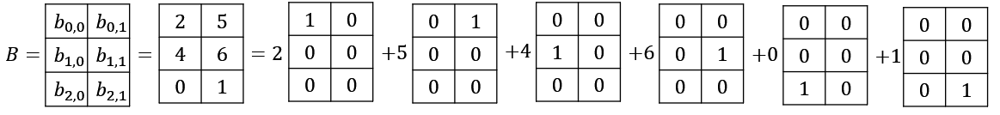



<div dir="rtl">

לאחר ביצוע התמרת DFT, התמונה מיוצגת בתחום התדרים.

בייצוג זה, כל נקודה מתארת רכיב תדר מרחבי מסוים בתמונה.

<dir>

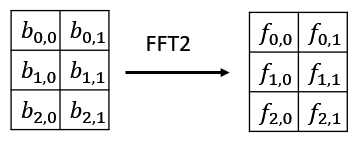

<div dir="rtl">

לאחר התמרת DFT ניתן לייצג את התמונה $B$ כצירוף לינארי של פונקציות בסיס בתדרים שונים:

$B=f_{0,0}\cdot F_{0,0}+f_{0,1}\cdot F_{0,1}+f_{1,0}\cdot F_{1,0}+f_{1,1}\cdot F_{1,1}+f_{2,0}\cdot F_{2,0}+f_{2,1}\cdot F_{2,1}$

כאשר:

$F_{0,0}$ - פונקציית הDC, המתאימה לתדר 0 בציר $x$ ולתדר 0 בציר $y$
זוהי פונקציה קבועה, כלומר מטריצה שבה כל הערכים זהים.

$f_{0,0}$ - המקדם הסקלרי של $F_{0,0}$ ומייצג את ערך האפור (אמפליטודה ופאזה) הממוצע של התמונה.

$f_{0,1}$ - המקדם של פונקציית בסיס בעלת מחזור אחד בציר האופקי ואפס מחזורים בציר האנכי
(כלומר, פונקציה שמשתנה לאורך $x$ וקבועה לאורך $y$).

<dir>

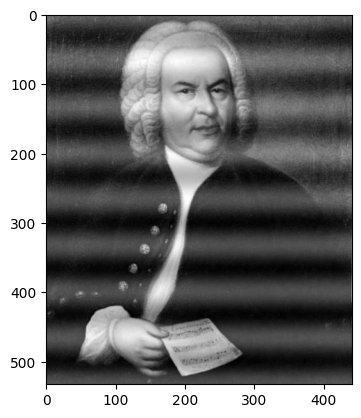

In [22]:
img1 = read_file(file_name='fftDemo1.tiff') / 255
nrows, ncols = img1.shape
plt.imshow(img1, cmap='gray');

In [5]:
f1 = fft2(img1)

<div dir="rtl">

מה הוא תדר הDC?

<dir>

In [6]:
print(int(img1.mean() * 255), int(255*f1[0,0].real/img1.size))

79 79


<div dir="rtl">

תדר הDC הוא התדר הקבוע  $F_{0,0}$, וערך המקדם שלו (אמפליטודה ופאזה) $f_{0,0}$ יהיה  הממוצע של כל רמות האפור של התמונה.

מכיוון שהתמונה מכילה המון פרטים (פנים, גוף רעש וכו'..) אזי המומצע של ערכי האפור יהיה גבוה (בדוגמה זו 79). ולכן נראה באזור זה תדר חזק.

<dir>

In [7]:
mag = abs(f1)  # Calculate the complex magnitude
mag = np.log1p(mag) # Logarithm scaling
fig = px.imshow(mag.real, color_continuous_scale='gray')
fig.update_layout(coloraxis_showscale=False)

<div dir="rtl">

דוגמה של aliasing ותדר נייקויסט:

<dir>

In [8]:
print(mag.real[0,:4])
print(mag.real[0,-3:])

[11.19716647  9.60786308  9.04699529  7.86234664]
[7.86234664 9.04699529 9.60786308]


<div dir="rtl">

## 13.1.2 FFT shift

<dir>

<div dir="rtl">

כדי שנוכל לראות את התדר המחזורי באופן ברור, נזיז את ערך הDC למרכז המטריצה ע"י FFTshift:

<dir>

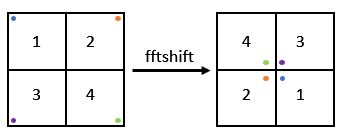

In [9]:
f1 = fft2(img1)
f1 = fftshift(f1)
f1a = np.log(np.abs(f1)**2)
fig = px.imshow(f1a, color_continuous_scale='gray')
fig.update_layout(coloraxis_showscale=False)

<div dir="rtl">

**שימו לב:** אחרי shift, תדרים נמוכים יהיו קרובים למרכז ותדרים גבוהים יהיו רחוקים מהמרכז.

<dir>

<div dir="rtl">

## 13.1.3 הסרת רעש:

לאחר עשינו התמרת FFT וגם shift, קיבלנו נקודה בהירה בצרכז התמונה (ערך הDC) ובנוסף שני פיקים לאורך ציר $Y$ כאשר $X=0$.

 שני הפיקים בספקטרום מייצגים תדר מרחבי אחד,
שבהתמרת פורייה 2D של תמונה ממשית מופיע תמיד כזוג תדרים סימטריים: חיובי ושלילי.

 אם נאפס אותם נוכל להסיר את הרעש מהתמונה:

<dir>

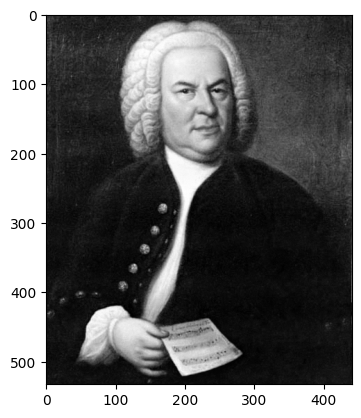

In [10]:
f1[266-8,220] = 0
f1[266+8,220] = 0
img_c = ifft2(ifftshift(f1)).real
plt.imshow(img_c, cmap='gray');

<div dir="rtl">

# 13.2 מסננים:


<dir>

<div dir="rtl">

## 13.2.1 HPF:

מסנן מעביר תדרים גבוהים – תפקידו להעביר אותות שהתדר שלהם גבוה מתדר מסוים. כל תדר נמוך יותר מסונן.

<dir>

<div dir="rtl">

שלב ראשון: התמרת התמונה למישור התדר ע"י FFT.

<dir>

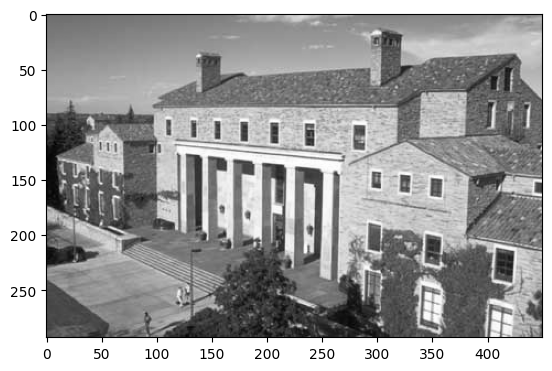

In [11]:
f1 = read_file(file_name='house.tiff') / 255
plt.imshow(f1, cmap='gray');

In [12]:
F1 = fft2(f1)
F1 = fftshift(F1)
F1a = np.log(np.abs(F1)**2)
F1a_min, F1a_max = F1a.min(), F1a.max()
fig = px.imshow(F1a, color_continuous_scale='gray', zmin=F1a_min, zmax=F1a_max)
fig.update_layout(coloraxis_showscale=False)

<div dir="rtl">

שלב שני: יצירת מסנן הHPF.

<dir>

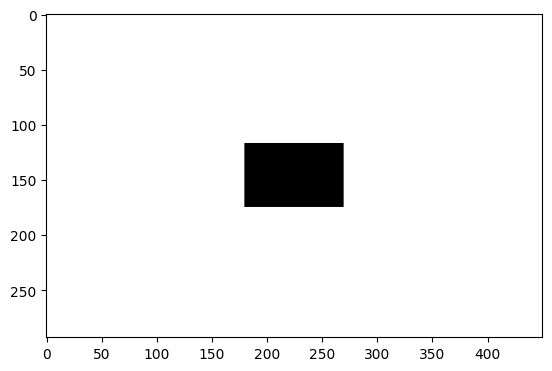

In [13]:
nrows, ncols = F1.shape
hpf = np.ones(F1.shape)
ch = nrows // 2
cw = ncols // 2
fh = nrows // 10
fw = ncols // 10
hpf[ch-fh:ch+fh, cw-fw:cw+fw] = 0

plt.imshow(hpf, cmap='gray');

<div dir="rtl">

שלב שלישי: העברת המסנן על התמונה ב**מישור התדר** , במישור התדר פעולות שהיו מורכבות במישור המיקום/הזמן הופכות פשוטות יותר במישור התדר.

קונבולוציה במיקום <-> כפל בתדר.
<dir>

In [14]:
H1 = F1 * hpf
H1a = np.log(0.00001 +np.abs(H1)**2)
fig = px.imshow(H1a, color_continuous_scale='gray', zmin=F1a_min, zmax=F1a_max)
fig.update_layout(coloraxis_showscale=False)

<div dir="rtl">

שלב רביעי: התמרת פורייה ההפוכה - מעבר חזרה למישור המיקום.

<dir>

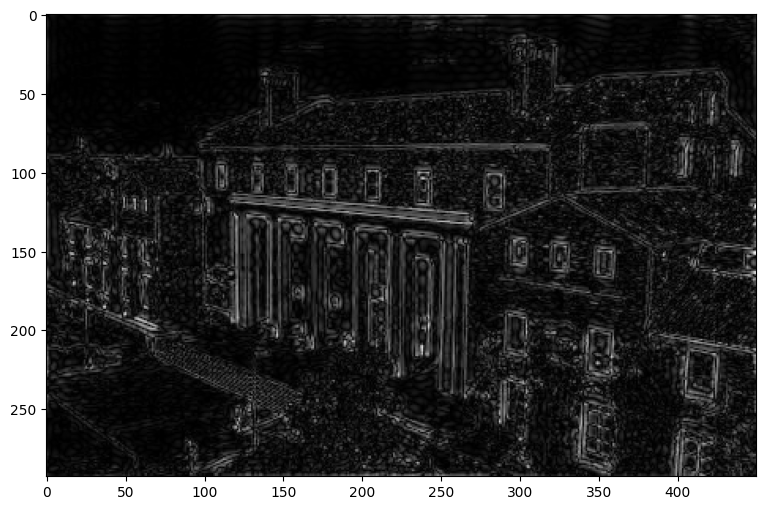

In [15]:
h1 = np.abs(ifft2(ifftshift(H1)).real)
plt.figure(figsize = (12,6))
plt.imshow(h1, cmap='gray');

<div dir="rtl">

**שאלה:** מדוע קיבלו מטריצת קצוות?


<dir>

<div dir="rtl">

**תשובה:**
לאחר העברת HPF - נחסמים התדרים המרחביים הנמוכים (אזורים אחידים), ונשארים רק תדרים גבוהים המייצגים שינויים חדים במרחב


<dir>

<div dir="rtl">

## 13.2.2 LPF:

מסנן מעביר תדרים נמוכים  – מעביר רק אותות עד תדר מסוים. כל תדר גבוה יותר מסונן. משמש לסינון רעשים מאותות שמע.

<dir>

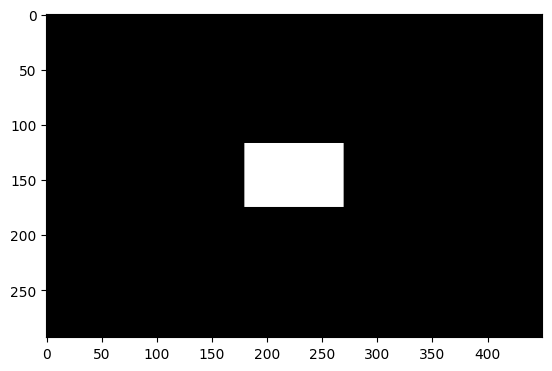

In [16]:
lpf = 1 - hpf
plt.imshow(lpf, cmap='gray');

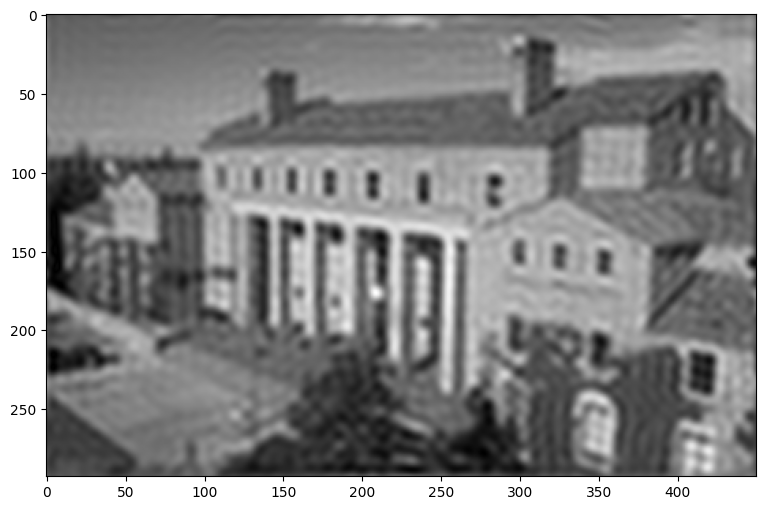

In [17]:
H2 = F1 * lpf
h2 = np.abs(ifft2(ifftshift(H2)).real)
plt.figure(figsize = (12,6))
plt.imshow(h2, cmap='gray');

<div dir="rtl">

**שאלה:** מדוע קיבלנו תמונה מטושטת?


<dir>

<div dir="rtl">

**תשובה:** תדרים גבוהים הוסרו ולכן אין קצוות חדים.


<dir>

<div dir="rtl">

## 13.2.3 תנודות ופונקציית rect וsinc:

**שאלה:** למה כאשר הפעלנו מסנן HPF/LPF קיבלנו תמונות עם תנודות?
<dir>

<div dir="rtl">

משפט הקונבולוציה:

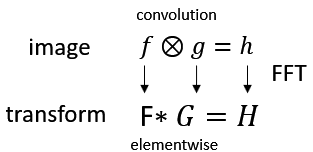
<dir>

<div dir="rtl">

מסנן חד במישור התדר (כמו HPF/LPF עם חיתוך מלבני – Step Function) שקול במרחב לפונקציית sinc. לפונקציית sinc יש תנודות , ולכן הקונבולוציה שלה עם התמונה יוצרת תנודות סביב קצוות.

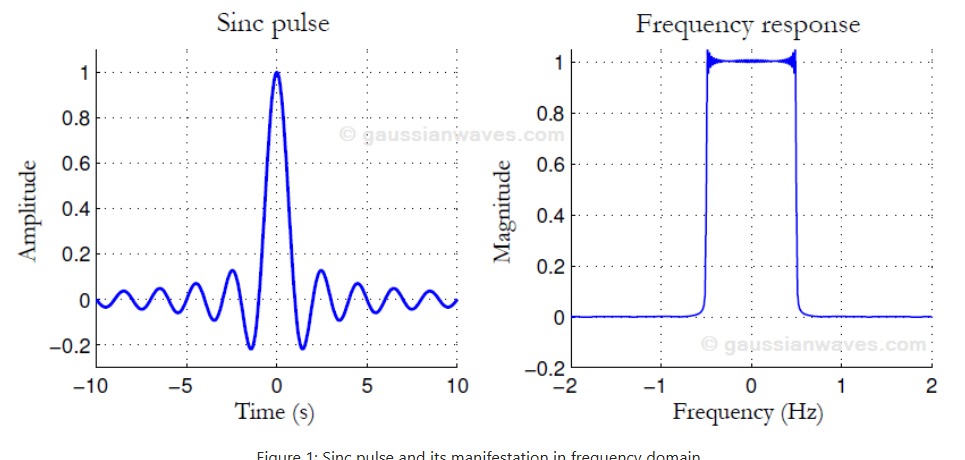


<dir>

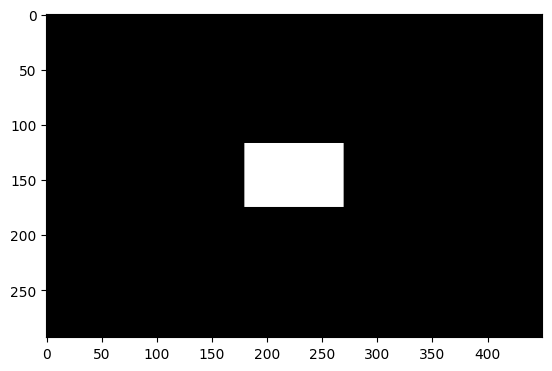

In [18]:
plt.imshow(lpf, cmap='gray');

In [19]:
F3 = fft2(lpf)
F3 = fftshift(F3)
F3a = np.log(0.0001 + np.abs(F3)**2)
fig = px.imshow(F3a, color_continuous_scale='gray')
fig.update_layout(coloraxis_showscale=False)

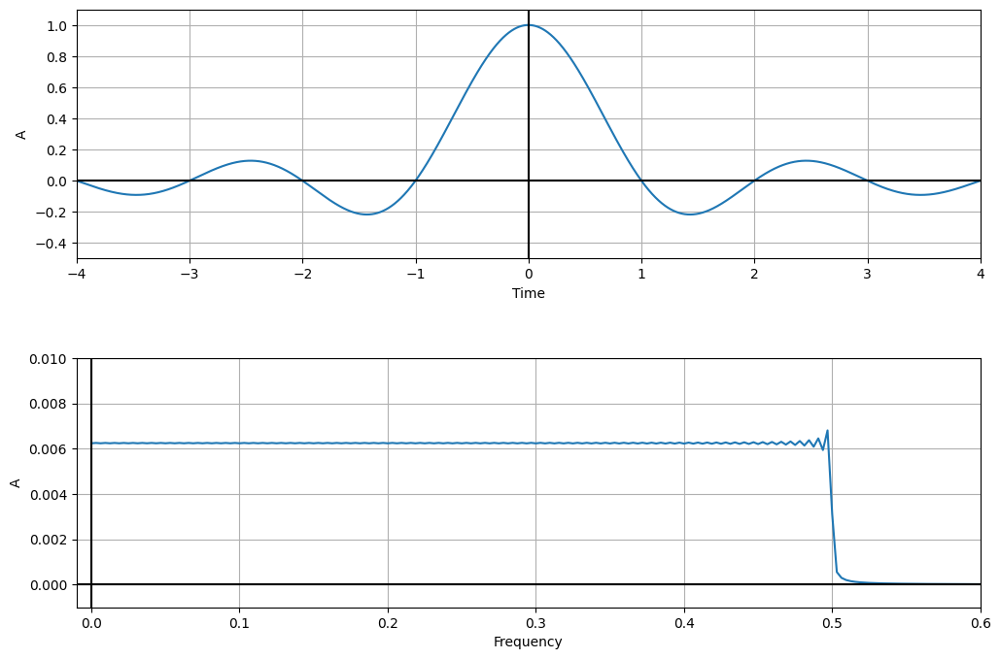

In [20]:
sampling_frequency = 500
sampling_interval = 1 / sampling_frequency
begin_time = -160
end_time = 160
x = np.arange(begin_time, end_time, sampling_interval)
y = np.sinc(x)
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
plt.subplots_adjust(hspace=0.4)
plot_axis(splot=axis[0], x=x, xlabel='Time', y=y, ylabel='A', xlim=[-4, 4], ylim=[-0.5, +1.1])
fourier_transform = np.fft.fft(y)/len(y)           # Normalize amplitude
fourier_transform = fourier_transform[range(int(len(y)/2))] # Exclude sampling frequency
tp_count = len(y)
values = np.arange(tp_count // 2)
time_period = tp_count/sampling_frequency
frequencies = values/time_period
yv = 2*abs(fourier_transform)
plot_axis(splot=axis[1], x=frequencies, xlabel='Frequency', y=yv, ylabel='A',xlim=[-0.01,0.6], ylim=[-0.001,0.01])
plt.show()

<div dir="rtl">

## 13.2.4 מסנן גאוסיאוני:


התמרת FFT של פונקציית גאוסיאן:

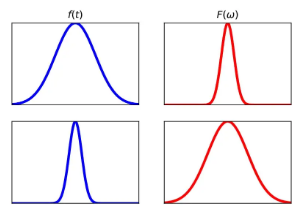
<dir>

<div dir="rtl">

גאוסיאן רחב במרחב מותמר לגאוסיאן צר בתדר ולהפך.

* מדוע? מסכה של גאוס רחב במרחב מחליקה חזק יותר (מיצוע הפיקסל עם יותר שכנים) מה שמוביל להחלקה רחבה יותר בתמונה ולשינויים איטיים יותר ולכן תדרים נמוכים. (תדרים נמוכים במישור התדר - סביב ה0) וכן להפך, גאוס צר במרחב מחליק חלש יותר ולכן תדרים גבוהים יותר וגאוס רחב במישור התדר.

* לכן אם $g$ הוא גאוס אזי ההתמרה שלו $G$ היא גאוס גם כן, והוא מסנן מסוג LPF.

* היתרון של מסנן גאוסיאוני על פני LPF רגיל הוא ההחלקה שמונעת את התנודות של מסנן LPF חד.


<dir>

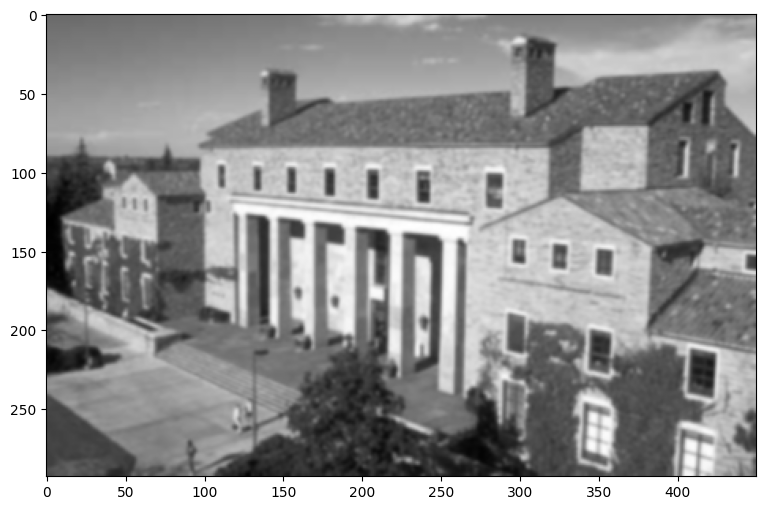

In [26]:
from scipy.ndimage import gaussian_filter

h3 = gaussian_filter(f1, 1)
plt.figure(figsize = (12,6))
plt.imshow(h3, cmap='gray');



<div dir="rtl">

## 13.2.5 התמרות נוספות:

* FFT של פונקציה קבועה היא נקודה (פונקציית $\delta$ (דלתא)).
* FFT של נקודה (פונקציית $\delta$ (דלתא)) היא קו ישר.

* טבלה (חלקית) של התמרות ידועות:
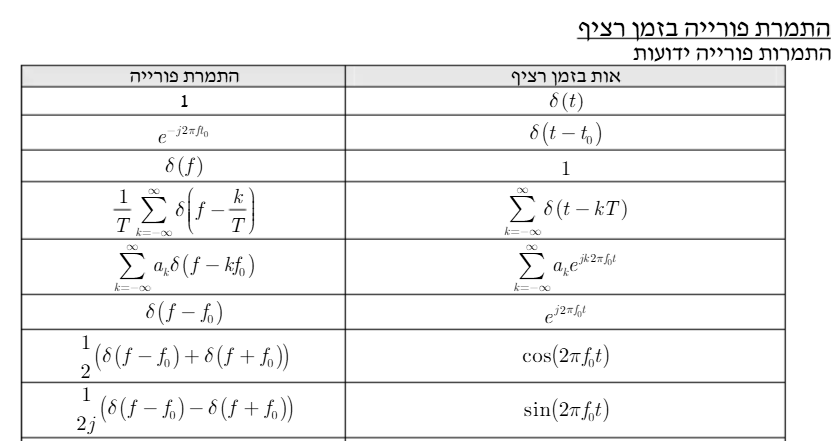


<dir>

<div dir="rtl">

## 13.2.6 שיפור היעילות:

נתבונן על מישור הזמן 1D (יותר פשוט להבנה):
* סיבוכיות ריצה של קונבולוציה במישור הזמן היא $o(n^2)$
* לעומת זאת - הפעלת FFT $o(n \log n)$, ולכן הסיבוכיות הכוללת היא גם $o(n \log n)$.
<dir>

<div dir="rtl">

## 13.2.7 HPF גאוסיאני:
* $HPF = 1 - LPF$.
* FFT 1 היא פונקציית $δ$ .
* מסנן LPF עם החלקה טובה יותר הוא גאויסאן.
* FFT של גאוס $g$ היא גאוס בתדר $G$.

ולכן נקבל:

$HPF \approx δ - G$.
<dir>